In [14]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline

import os

import numpy as np
from models import *

import torch
import torch.optim

from skimage.metrics import peak_signal_noise_ratio
from utils.denoising_utils import *

torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True

use_gpu = True

if use_gpu:
    dtype = torch.cuda.FloatTensor
else:
    dtype = torch.float32

print(f'GPU: {use_gpu}')

imsize =-1
PLOT = True

# Parameters of the Noise
sigma = 25
sigma_ = sigma/255.

GPU: True


In [15]:
## denoising
fname = 'data/denoising/F16_GT.png'

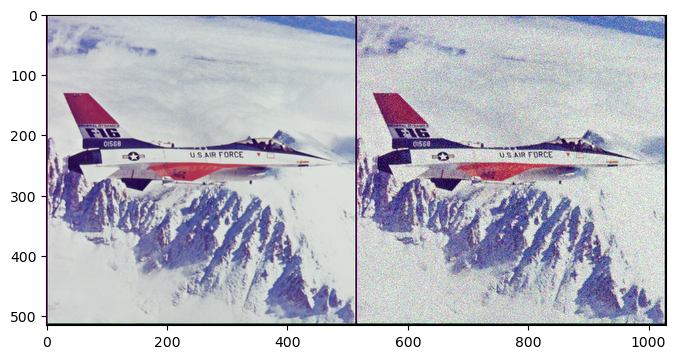

In [16]:
def get_noisy_image(img_np, sigma):

    img_noisy_np = np.clip(img_np + np.random.normal(scale=sigma, size=img_np.shape), 0, 1).astype(np.float32)
    img_noisy_pil = np_to_pil(img_noisy_np)

    return img_noisy_pil, img_noisy_np


# Compress the intensity of image to 0 ~ 1 and Add synthetic noise(Gaussin)
img_pil = crop_image(get_image(fname, imsize)[0], d=32)
img_np = pil_to_np(img_pil)

img_noisy_pil, img_noisy_np = get_noisy_image(img_np, sigma_)

if PLOT:
    plot_image_grid([img_np, img_noisy_np], 4, 6)

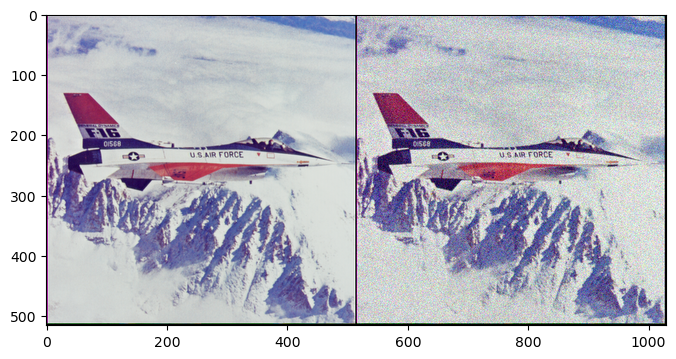

In [17]:
def get_possion_image(img_np, lam):

    img_noisy_np = np.clip(img_np + np.random.poisson(lam=0.3, size=img_np.shape), 0, 1).astype(np.float32)
    img_noisy_pil = np_to_pil(img_noisy_np)

    return img_noisy_pil, img_noisy_np

# Add synthetic noise(Gaussin)
img_pil = crop_image(get_image(fname, imsize)[0], d=32)
img_np = pil_to_np(img_pil)

img_poisson_pil, img_poisson_np = get_noisy_image(img_np, sigma_)

if PLOT:
    plot_image_grid([img_np, img_poisson_np], 4, 6)

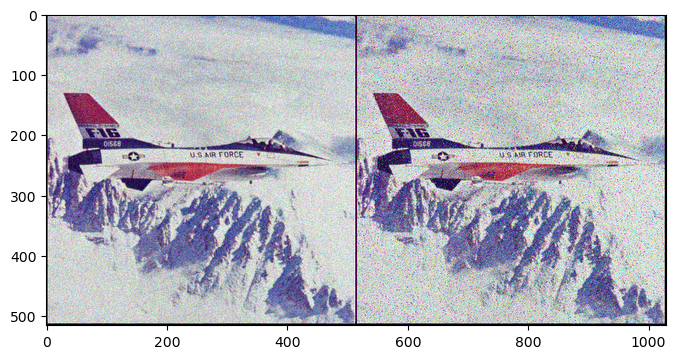

In [18]:
def get_noisy_image_salt_pepper(img_np, prob):

    img_noisy_np = np.copy(img_np)
    salt_pepper_mask = np.random.choice([0, 1, 2], size=img_np.shape, p=[prob / 2, prob / 2, 1 - prob])
    img_noisy_np[salt_pepper_mask == 0] = 0
    img_noisy_np[salt_pepper_mask == 1] = 1

    img_noisy_pil = np_to_pil(img_noisy_np)
    return img_noisy_pil, img_noisy_np

prob = 0.05
img_pil = crop_image(get_image(fname, imsize)[0], d=32)
img_np = pil_to_np(img_poisson_pil)

img_salt_pil, img_salt_np = get_noisy_image_salt_pepper(img_np, prob)

if PLOT:
    plot_image_grid([img_np, img_salt_np], 4, 6)

In [24]:
INPUT = 'noise' # 'meshgrid'
pad = 'reflection'
OPT_OVER = 'net' # 'net,input'

#training parameters
reg_noise_std = 1./30.
LR = 0.01

OPTIMIZER='adam' # 'LBFGS'
show_every = 100
exp_weight=0.99

num_iter = 500
input_depth = 3
figsize = 4
random_noise = False

#Network structure
net = get_net(input_depth, 'skip', pad,
              skip_n33d=256,    # modify will change the network parameters
              skip_n33u=256,    # modify will change the network parameters
              skip_n11=4,       # modify will change the network parameters
              num_scales=5,     # modify will change the network parameters
              upsample_mode='bilinear').type(dtype)

# whether to generate random noise or noisy image
if random_noise:
    net_input = get_noise(input_depth, INPUT, (img_pil.size[1], img_pil.size[0])).type(dtype).detach()
else:
    net_input = np_to_torch(img_noisy_np).type(dtype)

# Compute number of parameters
s  = sum([np.prod(list(p.size())) for p in net.parameters()]);
print ('Number of params: %d' % s)

# Loss
mse = torch.nn.MSELoss().type(dtype)

img_noisy_torch = np_to_torch(img_noisy_np).type(dtype)
img_torch = np_to_torch(img_np).type(dtype)

Number of params: 8661107


In [20]:
# define the ResNet model

#Network structure
net_ResNet = get_net(input_depth, 'ResNet', pad, upsample_mode='bilinear').type(dtype)

# whether to generate random noise or noisy image
if random_noise:
    net_input = get_noise(input_depth, INPUT, (img_pil.size[1], img_pil.size[0])).type(dtype).detach()
else:
    net_input = np_to_torch(img_salt_np).type(dtype)

# Compute number of parameters
s  = sum([np.prod(list(p.size())) for p in net_ResNet.parameters()]);
print ('Number of params: %d' % s)

# Loss
mse = torch.nn.MSELoss().type(dtype)

img_noisy_torch = np_to_torch(img_salt_np).type(dtype)
img_torch = np_to_torch(img_np).type(dtype)

Number of params: 49955


Starting optimization with ADAM
Iteration:  0  Loss:  0.09739097207784653  PSRN_gt:  10.11481321944993  PSNR_gt_sm:  17.88801132399977


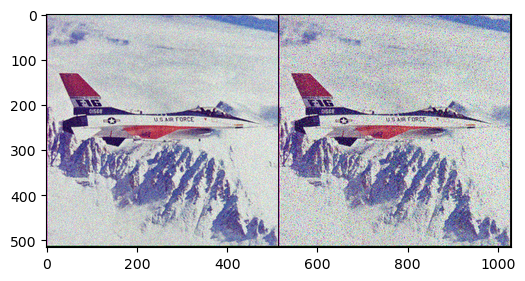

Iteration:  10  Loss:  0.02487785741686821  PSRN_gt:  16.041870562848256  PSNR_gt_sm:  18.573354897715376
Iteration:  20  Loss:  0.01582854986190796  PSRN_gt:  18.00558875458182  PSNR_gt_sm:  19.248795128380802
Iteration:  30  Loss:  0.013934902846813202  PSRN_gt:  18.558960765332813  PSNR_gt_sm:  19.80029258527874
Iteration:  40  Loss:  0.011524125933647156  PSRN_gt:  19.383920195502398  PSNR_gt_sm:  20.290759376062937
Iteration:  50  Loss:  0.01124122366309166  PSRN_gt:  19.491863995155608  PSNR_gt_sm:  20.71890887105001
Iteration:  60  Loss:  0.01073078066110611  PSRN_gt:  19.69368670753996  PSNR_gt_sm:  21.03932176455539
Iteration:  70  Loss:  0.010451734066009521  PSRN_gt:  19.808116725966602  PSNR_gt_sm:  21.27406291610837
Iteration:  80  Loss:  0.010420022532343864  PSRN_gt:  19.82131386174031  PSNR_gt_sm:  21.428953461710183
Iteration:  90  Loss:  0.010125678032636642  PSRN_gt:  19.945758575302296  PSNR_gt_sm:  21.51926811331935
Iteration:  100  Loss:  0.009913912042975426  PSR

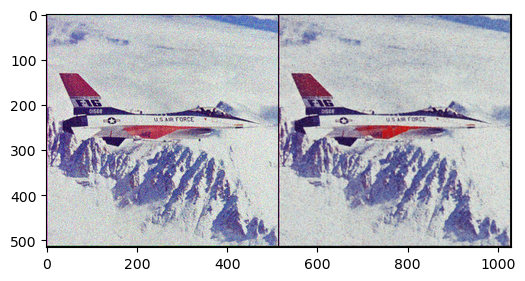

Iteration:  110  Loss:  0.009716536849737167  PSRN_gt:  20.124885168626268  PSNR_gt_sm:  21.57989370943121
Iteration:  120  Loss:  0.009636567905545235  PSRN_gt:  20.16077646840044  PSNR_gt_sm:  21.572970348168226
Iteration:  130  Loss:  0.013001362793147564  PSRN_gt:  18.86011145913772  PSNR_gt_sm:  21.531851392365017
Iteration:  140  Loss:  0.011485524475574493  PSRN_gt:  19.398491413094344  PSNR_gt_sm:  21.46354283786836
Iteration:  150  Loss:  0.010276149958372116  PSRN_gt:  19.881695424725038  PSNR_gt_sm:  21.404580505154996
Iteration:  160  Loss:  0.009613596834242344  PSRN_gt:  20.171141144891507  PSNR_gt_sm:  21.348459510113905
Iteration:  170  Loss:  0.009806845337152481  PSRN_gt:  20.084706898080352  PSNR_gt_sm:  21.29311438506217
Iteration:  180  Loss:  0.009205310605466366  PSRN_gt:  20.359615852461168  PSNR_gt_sm:  21.247147055873512
Iteration:  190  Loss:  0.008876072242856026  PSRN_gt:  20.517791636112896  PSNR_gt_sm:  21.21129492528308
Iteration:  200  Loss:  0.00858426

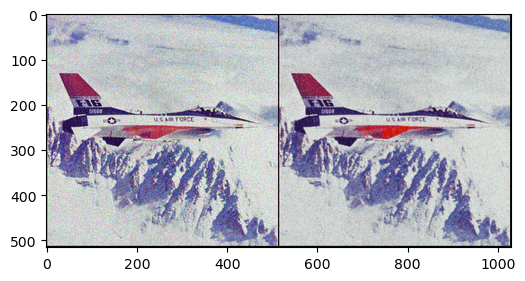

Iteration:  210  Loss:  0.008297868072986603  PSRN_gt:  20.81033469049529  PSNR_gt_sm:  21.186504772767663
Iteration:  220  Loss:  0.008019685745239258  PSRN_gt:  20.958426791547797  PSNR_gt_sm:  21.201148583821276
Iteration:  230  Loss:  0.007722059264779091  PSRN_gt:  21.122668705189046  PSNR_gt_sm:  21.229125148982625
Iteration:  240  Loss:  0.00741281732916832  PSRN_gt:  21.300167248239553  PSNR_gt_sm:  21.273983583697653
Iteration:  250  Loss:  0.007293475791811943  PSRN_gt:  21.37065453350859  PSNR_gt_sm:  21.32888258741051
Iteration:  260  Loss:  0.0069791823625564575  PSRN_gt:  21.561954588926987  PSNR_gt_sm:  21.39577509865575
Iteration:  270  Loss:  0.006658490747213364  PSRN_gt:  21.76624200954597  PSNR_gt_sm:  21.483654174499527
Iteration:  280  Loss:  0.006184903439134359  PSRN_gt:  22.086670607337243  PSNR_gt_sm:  21.59815921478532
Iteration:  290  Loss:  0.005743140354752541  PSRN_gt:  22.40850548101004  PSNR_gt_sm:  21.73897177521816
Iteration:  300  Loss:  0.0054494193

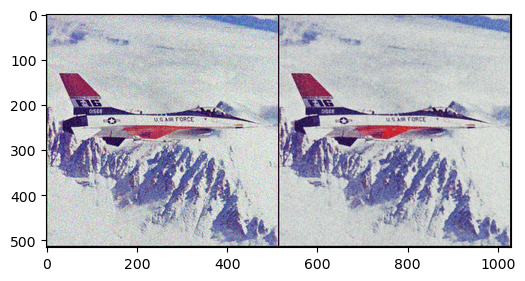

Iteration:  310  Loss:  0.005338260903954506  PSRN_gt:  22.72600190385438  PSNR_gt_sm:  22.068515331761283
Iteration:  320  Loss:  0.004981585778295994  PSRN_gt:  23.026324191725315  PSNR_gt_sm:  22.241072011800508
Iteration:  330  Loss:  0.004664463456720114  PSRN_gt:  23.311983090959018  PSNR_gt_sm:  22.430264535735404
Iteration:  340  Loss:  0.004480879753828049  PSRN_gt:  23.486367014552272  PSNR_gt_sm:  22.63658434875513
Iteration:  350  Loss:  0.004224126692861319  PSRN_gt:  23.7426310458962  PSNR_gt_sm:  22.85281493432604
Iteration:  360  Loss:  0.0040258122608065605  PSRN_gt:  23.95146493586699  PSNR_gt_sm:  23.07093887208413
Iteration:  370  Loss:  0.004065437708050013  PSRN_gt:  23.908927353165744  PSNR_gt_sm:  23.28474718456707
Iteration:  380  Loss:  0.004013518337160349  PSRN_gt:  23.964747640866033  PSNR_gt_sm:  23.48753639784473
Iteration:  390  Loss:  0.0036156277637928724  PSRN_gt:  24.41816328927025  PSNR_gt_sm:  23.69542413525754
Iteration:  400  Loss:  0.00349993514

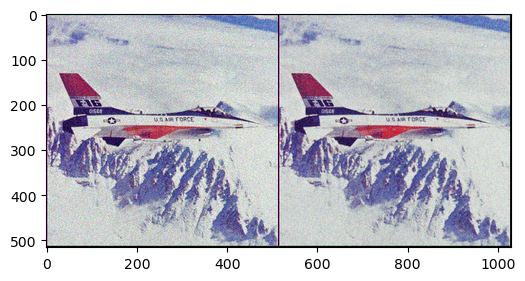

Iteration:  410  Loss:  0.00335441785864532  PSRN_gt:  24.74382872736694  PSNR_gt_sm:  24.134283331382246
Iteration:  420  Loss:  0.0032822999637573957  PSRN_gt:  24.8382173722371  PSNR_gt_sm:  24.34421674361982
Iteration:  430  Loss:  0.003172700759023428  PSRN_gt:  24.985709331317928  PSNR_gt_sm:  24.550492919693138
Iteration:  440  Loss:  0.003163093701004982  PSRN_gt:  24.99887961533223  PSNR_gt_sm:  24.745831671274757
Iteration:  450  Loss:  0.00321231409907341  PSRN_gt:  24.931819649776873  PSNR_gt_sm:  24.92423019278346
Iteration:  460  Loss:  0.003111849073320627  PSRN_gt:  25.06981495711581  PSNR_gt_sm:  25.086766706135645
Iteration:  470  Loss:  0.0030432604253292084  PSRN_gt:  25.16660892376972  PSNR_gt_sm:  25.246397554590455
Iteration:  480  Loss:  0.0030229929834604263  PSRN_gt:  25.195628682820193  PSNR_gt_sm:  25.389288788682627
Iteration:  490  Loss:  0.0029536541551351547  PSRN_gt:  25.29640375815372  PSNR_gt_sm:  25.524277683192928


In [21]:
net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()
#smoothing image
out_avg = net_input_saved

#without smoothing
#out_avg = None

last_net = None
psrn_noisy_last = 0

i = 0
def closure():

    global i, out_avg, psrn_noisy_last, last_net, net_input

    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)

    out = net_ResNet(net_input)

    # Smoothing
    if out_avg is None:
        out_avg = out.detach()
    else:
        out_avg = out_avg * exp_weight + out.detach() * (1 - exp_weight)

    #total_loss = mse(out, img_noisy_torch)
    total_loss = mse(out, img_torch)
    total_loss.backward()

    #evaluation with psrn
    psrn_noisy = peak_signal_noise_ratio(img_salt_np, out.detach().cpu().numpy()[0])   # the noise image
    psrn_gt    = peak_signal_noise_ratio(img_np, out.detach().cpu().numpy()[0])
    psrn_gt_sm = peak_signal_noise_ratio(img_np, out_avg.detach().cpu().numpy()[0])

    if  PLOT and i % 10 == 0:
        print ('Iteration: ', i, ' Loss: ', total_loss.item(), ' PSRN_gt: ', psrn_gt, ' PSNR_gt_sm: ', psrn_gt_sm)
    #print ('Iteration %05d    Loss %f   PSRN_gt: %f PSNR_gt_sm: %f' % (i, total_loss.item(), psrn_gt, psrn_gt_sm), '\r', end='')
    if  PLOT and i % show_every == 0:
        #out_np = torch_to_np(out)
        plot_image_grid([np.clip(img_np, 0, 1),
                         np.clip(torch_to_np(out_avg), 0, 1)], factor=figsize, nrow=2)



    # Backtracking
    if i % show_every:
        if psrn_noisy - psrn_noisy_last < -5:
            print('Falling back to previous checkpoint.')

            for new_param, net_param in zip(last_net, net_ResNet.parameters()):
                net_param.data.copy_(new_param.cuda())

            return total_loss*0
        else:
            last_net = [x.detach().cpu() for x in net_ResNet.parameters()]
            psrn_noisy_last = psrn_noisy

    i += 1

    return total_loss

p = get_params(OPT_OVER, net_ResNet, net_input)
optimize(OPTIMIZER, p, closure, LR, num_iter)

Starting optimization with ADAM
Iteration:  0  Loss:  0.09257002919912338  PSRN_gt:  10.335296199893062  PSNR_gt_sm:  17.393715289612008


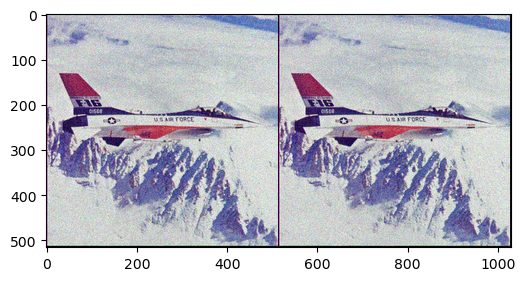

Iteration:  10  Loss:  0.025431429967284203  PSRN_gt:  15.946291870189528  PSNR_gt_sm:  17.729683232423618
Iteration:  20  Loss:  0.015563199296593666  PSRN_gt:  18.07901136654601  PSNR_gt_sm:  18.022837656149086
Iteration:  30  Loss:  0.013476923108100891  PSRN_gt:  18.70409283473322  PSNR_gt_sm:  18.29234859146642
Iteration:  40  Loss:  0.012851904146373272  PSRN_gt:  18.91032496687521  PSNR_gt_sm:  18.524777447749827
Iteration:  50  Loss:  0.012567336671054363  PSRN_gt:  19.00756753528103  PSNR_gt_sm:  18.718669405065395
Iteration:  60  Loss:  0.012366740964353085  PSRN_gt:  19.077447504678563  PSNR_gt_sm:  18.87666229738741
Iteration:  70  Loss:  0.012197470292448997  PSRN_gt:  19.137302616153377  PSNR_gt_sm:  19.003741243711595
Iteration:  80  Loss:  0.01202475093305111  PSRN_gt:  19.199239162654735  PSNR_gt_sm:  19.106574953051272
Iteration:  90  Loss:  0.011841709725558758  PSRN_gt:  19.265855861213684  PSNR_gt_sm:  19.19054024598741
Iteration:  100  Loss:  0.011623961851000786 

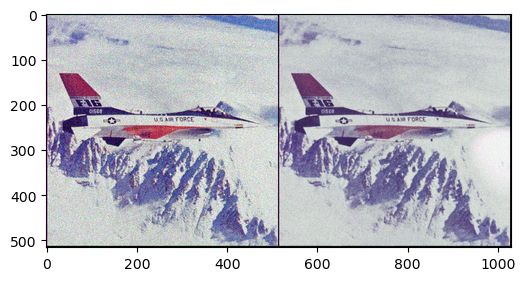

Iteration:  110  Loss:  0.011425293982028961  PSRN_gt:  19.421326239125104  PSNR_gt_sm:  19.325356680039928
Iteration:  120  Loss:  0.011295895092189312  PSRN_gt:  19.470793620305088  PSNR_gt_sm:  19.37991499131527
Iteration:  130  Loss:  0.011169257573783398  PSRN_gt:  19.519757222464783  PSNR_gt_sm:  19.428768310732746
Iteration:  140  Loss:  0.011148057878017426  PSRN_gt:  19.528008281688198  PSNR_gt_sm:  19.470118868265224
Iteration:  150  Loss:  0.011005996726453304  PSRN_gt:  19.58370617003396  PSNR_gt_sm:  19.5071711837177
Iteration:  160  Loss:  0.010851661674678326  PSRN_gt:  19.64503778290396  PSNR_gt_sm:  19.54466463114084
Iteration:  170  Loss:  0.011028945446014404  PSRN_gt:  19.574659832687328  PSNR_gt_sm:  19.579984985766792
Iteration:  180  Loss:  0.010815552435815334  PSRN_gt:  19.659513018518734  PSNR_gt_sm:  19.60950537145275
Iteration:  190  Loss:  0.01063038781285286  PSRN_gt:  19.73450915170389  PSNR_gt_sm:  19.64375469050061
Iteration:  200  Loss:  0.010488665662

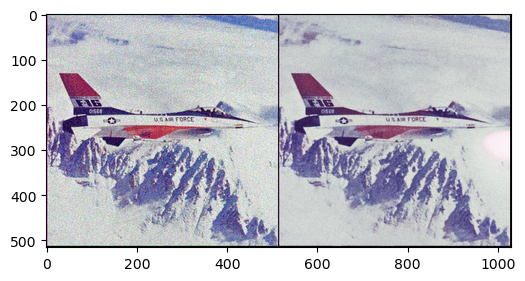

Iteration:  210  Loss:  0.010431806556880474  PSRN_gt:  19.816405098433595  PSNR_gt_sm:  19.71239005505694
Iteration:  220  Loss:  0.010383154265582561  PSRN_gt:  19.836707163487826  PSNR_gt_sm:  19.740981362991164
Iteration:  230  Loss:  0.010372122749686241  PSRN_gt:  19.841323923277763  PSNR_gt_sm:  19.76599061889646
Iteration:  240  Loss:  0.010340876877307892  PSRN_gt:  19.854426576930276  PSNR_gt_sm:  19.787472993294507
Iteration:  250  Loss:  0.010331768542528152  PSRN_gt:  19.858253560840467  PSNR_gt_sm:  19.806002309073744
Iteration:  260  Loss:  0.010294183157384396  PSRN_gt:  19.874081315490226  PSNR_gt_sm:  19.822085313367733
Iteration:  270  Loss:  0.010283978655934334  PSRN_gt:  19.878388383441365  PSNR_gt_sm:  19.83696449368328
Iteration:  280  Loss:  0.010291806422173977  PSRN_gt:  19.875083988830603  PSNR_gt_sm:  19.848173920460106
Iteration:  290  Loss:  0.01028124988079071  PSRN_gt:  19.87954116587765  PSNR_gt_sm:  19.85827367733691
Iteration:  300  Loss:  0.01025607

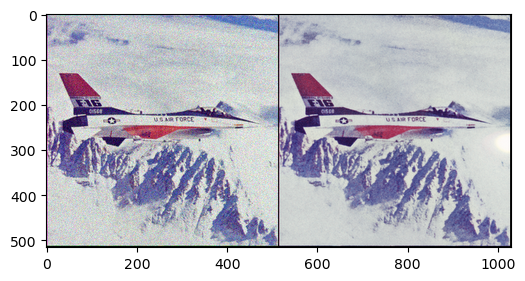

Iteration:  310  Loss:  0.01023641787469387  PSRN_gt:  19.89851999873551  PSNR_gt_sm:  19.87670963139663
Iteration:  320  Loss:  0.010300873778760433  PSRN_gt:  19.87125970778263  PSNR_gt_sm:  19.88272773648473
Iteration:  330  Loss:  0.010255340486764908  PSRN_gt:  19.890499270201314  PSNR_gt_sm:  19.888082229100807
Iteration:  340  Loss:  0.01024920679628849  PSRN_gt:  19.893097671876543  PSNR_gt_sm:  19.89391474000143
Iteration:  350  Loss:  0.010235656052827835  PSRN_gt:  19.89884304736598  PSNR_gt_sm:  19.89897764306923
Iteration:  360  Loss:  0.010199661366641521  PSRN_gt:  19.914142594603227  PSNR_gt_sm:  19.90471936112517
Iteration:  370  Loss:  0.01019630953669548  PSRN_gt:  19.91557002804385  PSNR_gt_sm:  19.910254049727584
Iteration:  380  Loss:  0.010163630358874798  PSRN_gt:  19.929511266618583  PSNR_gt_sm:  19.915539147677205
Iteration:  390  Loss:  0.010159621015191078  PSRN_gt:  19.931225271002713  PSNR_gt_sm:  19.921236440288805
Iteration:  400  Loss:  0.01012638770043

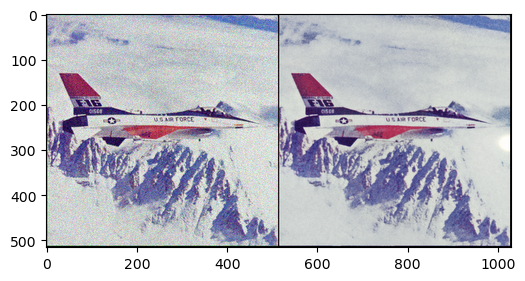

Iteration:  410  Loss:  0.010126505978405476  PSRN_gt:  19.945403973145844  PSNR_gt_sm:  19.933219832788037
Iteration:  420  Loss:  0.01008237898349762  PSRN_gt:  19.964370191454357  PSNR_gt_sm:  19.93993131675365
Iteration:  430  Loss:  0.010070659220218658  PSRN_gt:  19.969421148782885  PSNR_gt_sm:  19.947288974535965
Iteration:  440  Loss:  0.010045170783996582  PSRN_gt:  19.980427110852837  PSNR_gt_sm:  19.955464452120125
Iteration:  450  Loss:  0.01001290325075388  PSRN_gt:  19.994399938450773  PSNR_gt_sm:  19.964494137783483
Iteration:  460  Loss:  0.010001743212342262  PSRN_gt:  19.999243318338994  PSNR_gt_sm:  19.973337881552094
Iteration:  470  Loss:  0.010024934075772762  PSRN_gt:  19.989184882864688  PSNR_gt_sm:  19.981585585617616
Iteration:  480  Loss:  0.01002776250243187  PSRN_gt:  19.987959400716683  PSNR_gt_sm:  19.987885932440584
Iteration:  490  Loss:  0.00997878797352314  PSRN_gt:  20.009222157356593  PSNR_gt_sm:  19.994483583402413


In [25]:
net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()
#smoothing image
out_avg = net_input_saved

#without smoothing
#out_avg = None

last_net = None
psrn_noisy_last = 0

i = 0
def closure():

    global i, out_avg, psrn_noisy_last, last_net, net_input

    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)

    out = net(net_input)

    # Smoothing
    if out_avg is None:
        out_avg = out.detach()
    else:
        out_avg = out_avg * exp_weight + out.detach() * (1 - exp_weight)

    #total_loss = mse(out, img_noisy_torch)
    total_loss = mse(out, img_torch)
    total_loss.backward()

    #evaluation with psrn
    psrn_noisy = peak_signal_noise_ratio(img_salt_np, out.detach().cpu().numpy()[0])   # the noise image
    psrn_gt    = peak_signal_noise_ratio(img_np, out.detach().cpu().numpy()[0])
    psrn_gt_sm = peak_signal_noise_ratio(img_np, out_avg.detach().cpu().numpy()[0])

    if  PLOT and i % 10 == 0:
        print ('Iteration: ', i, ' Loss: ', total_loss.item(), ' PSRN_gt: ', psrn_gt, ' PSNR_gt_sm: ', psrn_gt_sm)
    #print ('Iteration %05d    Loss %f   PSRN_gt: %f PSNR_gt_sm: %f' % (i, total_loss.item(), psrn_gt, psrn_gt_sm), '\r', end='')
    if  PLOT and i % show_every == 0:
        #out_np = torch_to_np(out)
        plot_image_grid([np.clip(img_np, 0, 1),
                         np.clip(torch_to_np(out_avg), 0, 1)], factor=figsize, nrow=2)



    # Backtracking
    if i % show_every:
        if psrn_noisy - psrn_noisy_last < -5:
            print('Falling back to previous checkpoint.')

            for new_param, net_param in zip(last_net, net.parameters()):
                net_param.data.copy_(new_param.cuda())

            return total_loss*0
        else:
            last_net = [x.detach().cpu() for x in net.parameters()]
            psrn_noisy_last = psrn_noisy

    i += 1

    return total_loss

p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR, num_iter)

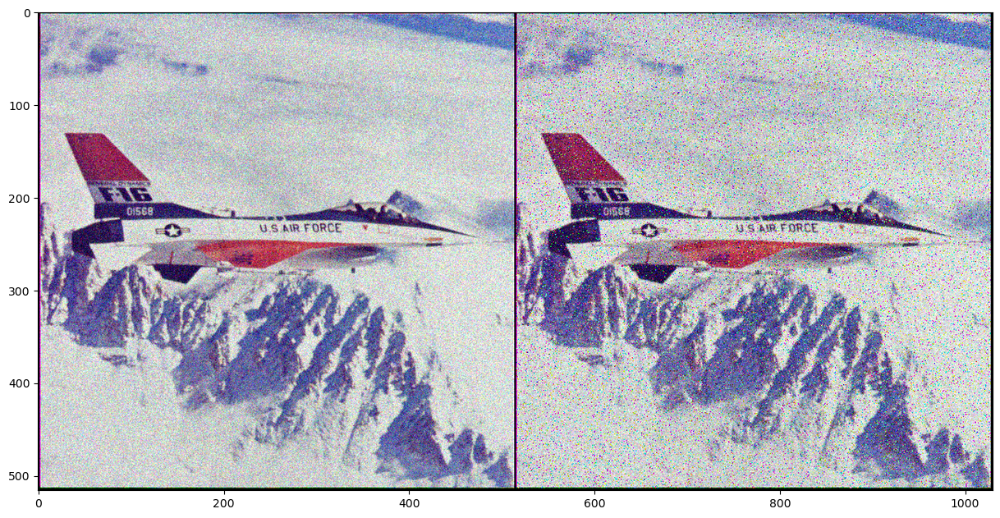

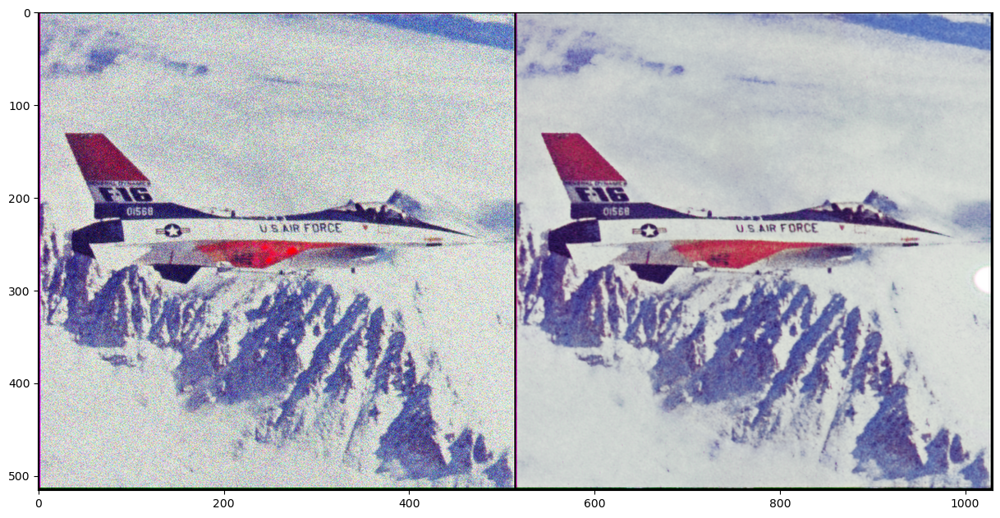

In [26]:
out_skip_np = torch_to_np(net(net_input))
out_resnet_np = torch_to_np(net_ResNet(net_input))
if PLOT:
    plot_image_grid([img_np, img_salt_np], factor=13)
    plot_image_grid([out_resnet_np, out_skip_np], factor=13)
    # the skip is better than the ResNet, and skip 256 is better than skip 128